# Session 3: Downstream scRNAseq analysis tools

## Google colab setup

In [1]:
import sys
if 'google.colab' in sys.modules:
    !pip install --quiet scrnatools
    !pip install --quiet scvi-colab
    from scvi_colab import install
    install()
    from google.colab import drive
    drive.mount("/content/gdrive")

In [2]:
import scrnatools as rna
import scanpy as sc
import pandas as pd
import numpy as np
import scvi

Global seed set to 0


## Data import

In [3]:
adata = sc.read("data/scRNAseq_tutorial_thymus_data.h5ad")
model = scvi.model.SCVI.load("data/scRNAseq_tutorial_thymus_data_scVI_model", adata=adata)

INFO     File data/scRNAseq_tutorial_thymus_data_scVI_model/model.pt already downloaded                            


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


## Dimensionality reduction

Representing cells in 2 dimensions based on their much higher (20,000) dimension gene expression is often a desireable first downstream analysis step. Two algoriithms are usually used for this purpose, uniform manifold approximation and projection (UMAP) and t-distributed stochastic neighbor embedding (TSNE). Theoretically UMAP is preferable as it attempts to preserve both global and local distances between cells while TSNE only preserves local distances (making distances on UMAPs technically more interpretable than those on TSNEs). However in practice you should *never* place much meaning on cell's relative position in either UMAPs or TSNEs as distilling 20 thousand dimensions into 2 dimensions will *always* distort distances between cells. In general, I have found UMAPs to be more useful when studying a dataset containing what you expect to be a lineage/related set of cells while TSNEs are generally more useful when you have a dataset containing many diverse, distinct cell types but both often have similar trends for the same dataset making them largely interchangeable in practice. Just remember that these serve *only* as visualization aids, and that biological insight is *always* required to validate and preliminary conclusions drawn from UMAPs/TSNEs.

### UMAP

In [4]:
sc.pp.neighbors(adata, use_rep="X_scVI") # Calculates each cell's nearest neighbors in scVI latent space
sc.tl.umap(adata, min_dist=0.3) # Uses the nearest neighbors in scvi-space to calculate UMAP coordinates for each cell
# The min_dist UMAP parameter can be tweaked to bring cells in the visualization closer together, but just leaving all the settings 
# at their defaults works as well

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


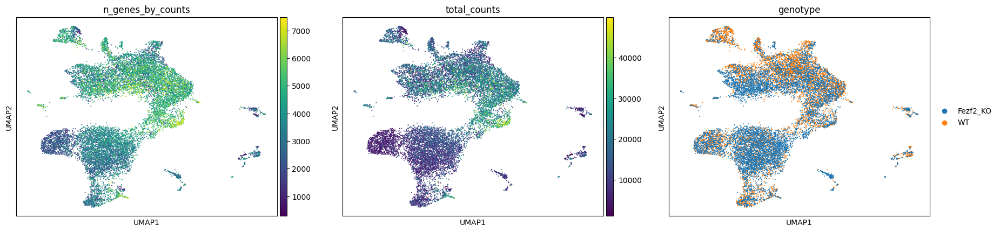

In [5]:
sc.pl.umap(
    adata,
    color=["n_genes_by_counts", "total_counts", "genotype"],
)

### TSNE

In [6]:
sc.tl.tsne(adata, use_rep="X_scVI") # calculates TSNE coordinates from scvi latent space

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


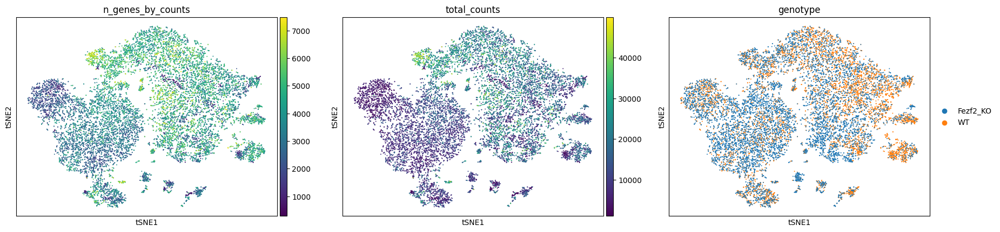

In [7]:
sc.pl.tsne(
    adata,
    color=["n_genes_by_counts", "total_counts", "genotype"],
)

## Leiden clustering

Next, groups of transcriptionally similar cells (based on their nearest neighbors in scVI latent space) are often broken into clusters corresponding to distinct cell types using the leiden unbiased clustering algorithm. The resolution parameter will break the cells up into more, finer clusters the larger the value, and you shouldd always stick to a value less than 1 to avoid overclustering. Picking a value for the resolution is more of an art than a science, but a good approach is to start around 0.5, then use feature plots of known marker genes for the broad cell types you expect to see in your data to increase or decrease this value until you see clustering results that largely seperates known biologically distinct populations.

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


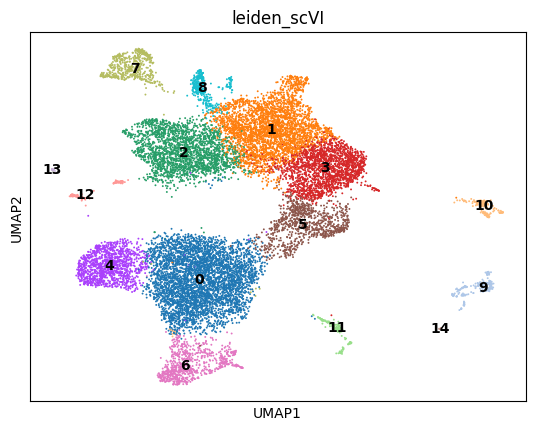

In [8]:
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=0.5)
sc.pl.umap(
    adata,
    color=["leiden_scVI"],
    legend_loc="on data",
)

## Cell type identification

In [9]:
geneList = ["Ptprc", "Tcf4", "Bcam",  "Psmb11", "Ccl21a", "Mki67", "Aire", "Fezf2", "Tspan8", "Ascl1", "Gp2", "Pou2f3", "Foxj1"]

### Feature plot

UMAP/TSNE feature plots are an indispendible tool for identifying cell types, removing contaminant clusters, and refining clustering results. I will typically plot gene expression on these feature plots with the colormaps clipped to the 1st and 99th percentile to prevent cells with outlier expression of that gene from skewing the colormap too much towards high/low values.

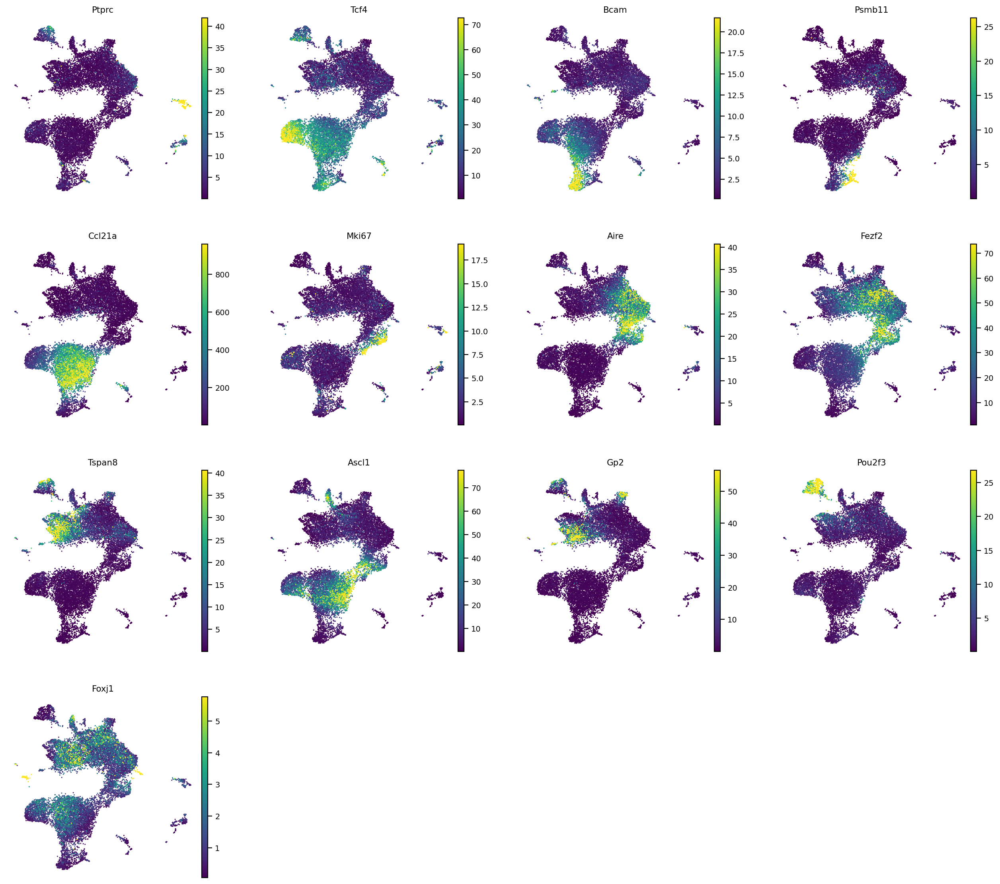

In [10]:
sc.settings.figdir = "analysis"
rna.pl.gene_embedding(
    adata,
    geneList,
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    figsize = (4, 4), # size of each panel
    dpi = 80, # resolution of figure to show
    dpi_save = 300, # resolution of figure to save
    min_quantile = 0.01, # the quantile of expression for a gene to set the minimum of the colorbar to
    max_quantile = 0.99, # the quantile of expression for a gene to set the maximum of the colorbar to
    use_rep = "X_umap", # the embedding coordinates in 'adata.obsm' to use
    save="_marker_genes_scvi_expression.png",
    cmap="viridis"
    # can also pass other arguments through to sc.pl.umap such as s, cmap, etc (see scanpy documentation)
)

### Remove contaminating populations

After a first round of clustering and feature plotting it is appropriate to remove clusters of cells you aren't interested in such as known
sort contaminants

In [21]:
adata = adata[~adata.obs.leiden_scVI.isin(["13", "10", "9", "14", "11"])]

### Recompute UMAP/clusters

Then you will need to create a new UMAP/TSNE and recluster based on only the cells of interest

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


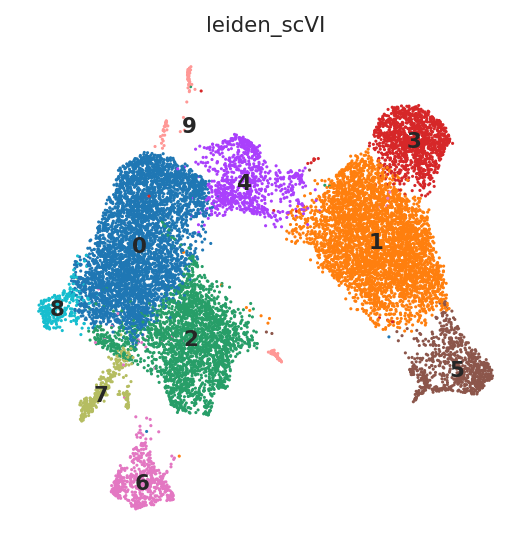

In [22]:
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.3)
sc.tl.tsne(adata, use_rep="X_scVI")
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=0.5)
sc.pl.umap(
    adata,
    color=["leiden_scVI"],
    legend_loc="on data",
)

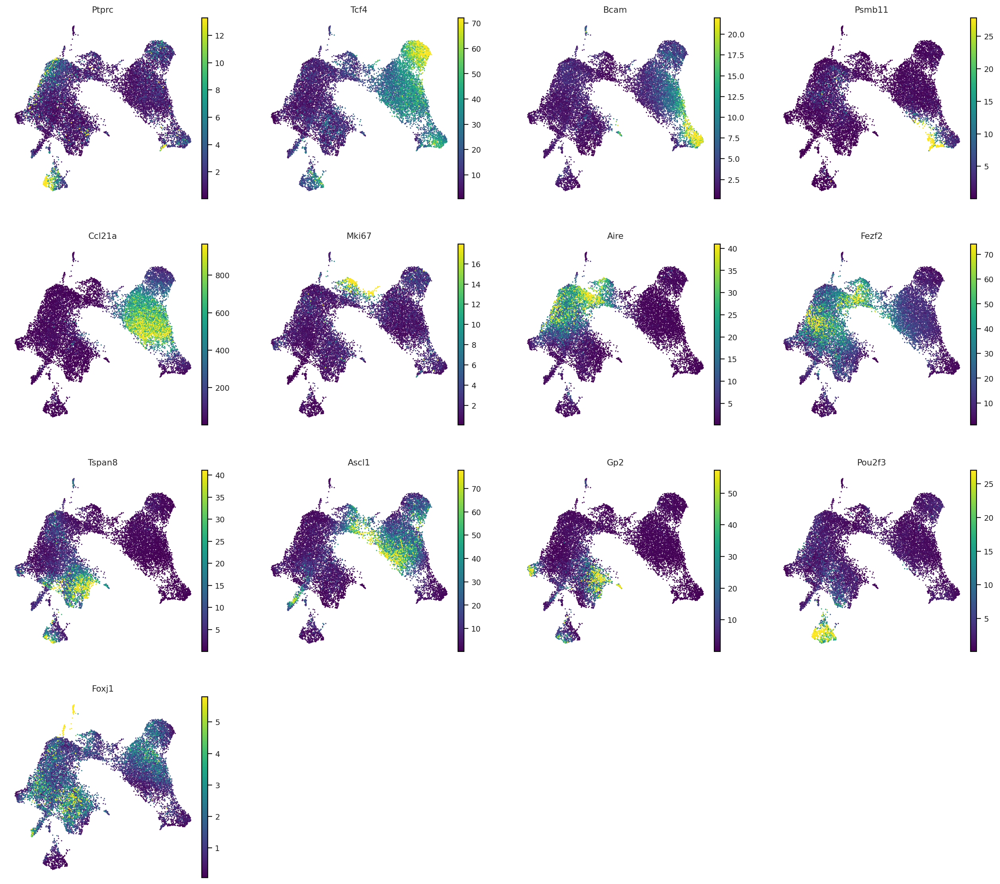

In [24]:
sc.settings.figdir = "analysis"
rna.pl.gene_embedding(
    adata,
    geneList,
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    figsize = (4, 4), # size of each panel
    dpi = 80, # resolution of figure to show
    dpi_save = 300, # resolution of figure to save
    min_quantile = 0.01, # the quantile of expression for a gene to set the minimum of the colorbar to
    max_quantile = 0.99, # the quantile of expression for a gene to set the maximum of the colorbar to
    use_rep = "X_umap", # the embedding coordinates in 'adata.obsm' to use
    save="_marker_genes_scvi_expression.png",
    cmap="viridis",
)

### Label cell types

Finally you can use known marker genes to annotate cell types in your dataset

In [32]:
# Make a copy of your leiden cluster IDs
adata.obs["cell_type"] = adata.obs.leiden_scVI.copy()

In [33]:
# Create a diictionary mapping each leiden cluster to a cell type based on marker genes
cellTypes = {
    "5": "cTECs",
    "1": "Ccl21a+ TECs",
    "3": "precursor TECs",
    "4": "TAC-TECs",
    "0": "Aire+ mTECs",
    "9": "Ciliated MCs",
    "8": "Microfold MCs",
    "7": "Neuroendocrine MCs",
    "2": "Cornefied MCs",
    "6": "Tuft cells"
}

In [34]:
# use the cell type dictionary to annotate cells
adata.obs.cell_type = adata.obs.cell_type.replace(cellTypes)

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


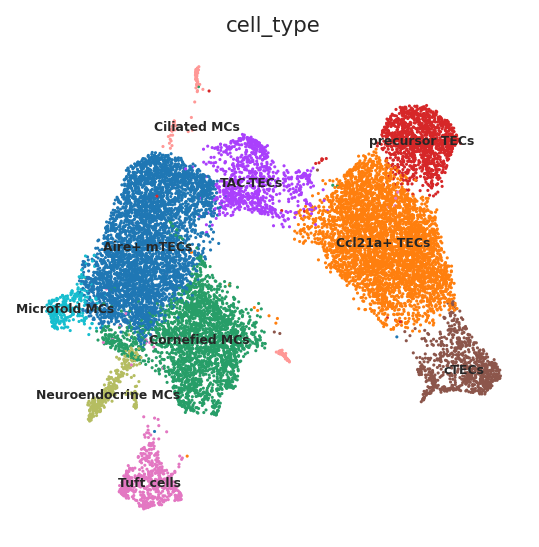

In [35]:
sc.pl.umap(
    adata,
    color=["cell_type"],
    legend_loc="on data",
    legend_fontsize="xx-small",
)

### Heatmap

It can also sometimes be useful to create heatmaps displaying the average gene expression within each cluster, but here it is important to remember to z-score each gene's expression across clusters so that genes with higher average expression don't skew the colormap.

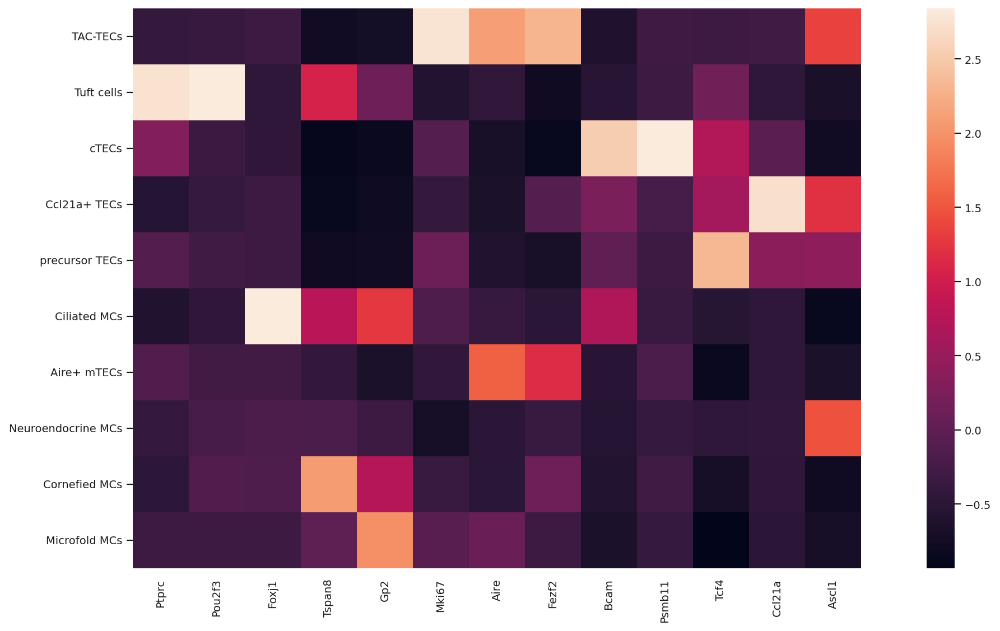

In [36]:
rna.pl.gene_heatmap(
    adata,
    geneList,
    obs_key="cell_type", # categorical grouping to display
    # obs_values=["DCs", "4", "T"], # values from obs key group to display
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    reverse_axis=False, # boolean to reverse x and y axes. Default False
    cell_size=50, # integer specifying the size of each cell in the heatmap
    dpi=80, # resolution of figure to show
    z_score=1,
    # save_path specifies path to save figure
    # can also pass other arguments through to sc.pl.umap such as s, cmap, etc (see matplotlib documentation)
)

### Violinplot

Finally, violinplots are useful for visualizing changes in a gene's expreession across samples (i.e. WT vs KO)

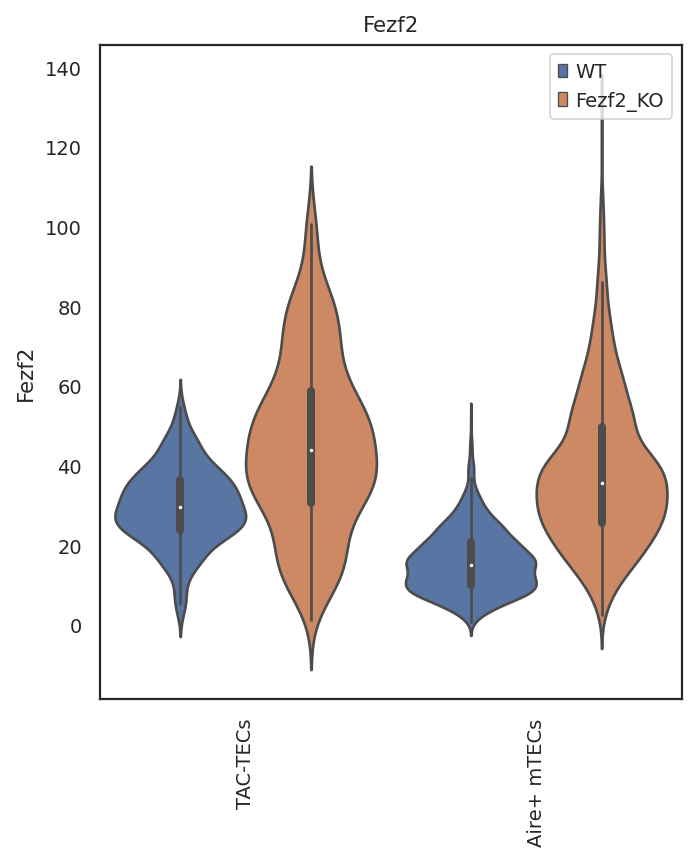

In [37]:
rna.pl.gene_violinplot(
    adata,
    ["Fezf2"],
    x_key="cell_type", # categorical grouping to display on the x axis
    x_values=["TAC-TECs", "Aire+ mTECs"],
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    hue_key="genotype", # categorical grouping to color the grouped violin plots by
    ncols=3, # number of columns for plots to display
    nrows=4, # number of rows for plots to display. ncols * nrows must be > or = total number of genes in geneList to display
    dpi=80, # resolution of figure
    # save_path specifies path to save figure
    # can also pass other arguments through to sc.pl.umap such as s, cmap, etc (see scanpy documentation)
)

## Differential expression

### Cluster-specific marker genes

Differrential gene expression analyses can be performed with a trained scVI model to identiffy marker genes for each of your clusters/cell types

In [6]:
deGenes = rna.tl.cluster_de(
    adata[adata.obs.genotype == "WT"],
    model, # Trained scVI model for the data
    cluster_key="cell_type", # cell type labels to calculate DE genes between
    lfc_mean_threshold=0, # Minimum LFC to consider a DE gene (default to only look at >0, i.e. genes with higher expression in a given cluster than everywhere else)
    bayes_factor_threshold=3, # Minimum bayes factor to consider a DE gene (see scVI documentation for explanation)
    non_zeroes_proportion_threshold=0.1, # Minimum proportion of cells with non-zero expression to consider a DE gene (removes stochastic noise/contamination)
    subset=True, # Whether to subset the DE gene list based on thresholds or return all genes in data
    save_path="analysis/cluster_DE", # Folder to save DE gene dataframes to
)

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
DE...: 100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


scvi-tools calculates a FDR for each gene, so a simple method of filtering the results on highly DE genes across clusteres is to only consider genes with a FDR < 0.05. However, using custom thrsholds on the mean log-fold change, bayes factor (which can be thought of as a measure of the sigficance of DE), and non-zero raw expression proportion across clusters (genes expressed in. only a few cells within a cluster are unlikely to be truly DE) can be used to get a less conservative list of highly DE genes, at the expense of more false positives. It is always helpful to go back to feature plots of normalized and raw expression to get a sense of how truly DE a given gene of interest arising from this analysis is, as well as performing biological validation.

In [7]:
deGenes["Aire+ mTECs"]

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Il13,0.9850,0.0150,4.184591,0.000954,0.000068,0.0,0.25,4.595845,4.751030,2.350873,...,3.739341,0.139068,0.546433,0.054197,8.608588,0.438647,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Pah,0.9796,0.0204,3.871609,0.000079,0.000009,0.0,0.25,4.746547,4.506318,3.704323,...,0.334397,0.005304,0.117577,0.004613,0.747705,0.032350,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Gm50309,0.9792,0.0208,3.851782,0.000083,0.000004,0.0,0.25,4.746531,5.049190,4.048327,...,0.301714,0.004382,0.116780,0.003921,0.642318,0.012551,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Gm26537,0.9792,0.0208,3.851782,0.000088,0.000013,0.0,0.25,4.495957,4.572937,2.966828,...,0.227182,0.021218,0.137106,0.014760,0.617725,0.125671,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Csn2,0.9786,0.0214,3.822732,0.003481,0.000614,0.0,0.25,3.457302,3.657103,2.084535,...,18.821524,2.069193,0.844161,0.202491,42.908760,5.611112,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ccl20,0.9532,0.0468,3.013941,0.000651,0.000796,0.0,0.25,1.658958,1.930223,3.059838,...,3.328023,4.060653,0.229972,0.122232,6.712499,9.617452,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Ablim2,0.9530,0.0470,3.009467,0.000093,0.000027,0.0,0.25,2.876698,2.723324,2.893896,...,0.234356,0.051661,0.100040,0.036900,0.638517,0.244020,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Drc1,0.9528,0.0472,3.005011,0.000100,0.000040,0.0,0.25,2.635904,2.745033,2.704943,...,0.250299,0.100784,0.111200,0.051891,0.656765,0.383106,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest
Ptgds,0.9528,0.0472,3.005011,0.000708,0.000205,0.0,0.25,3.094812,3.380610,2.532575,...,4.417701,0.830950,0.249900,0.098017,10.024157,2.297281,True,Aire+ mTECs vs Rest,Aire+ mTECs,Rest


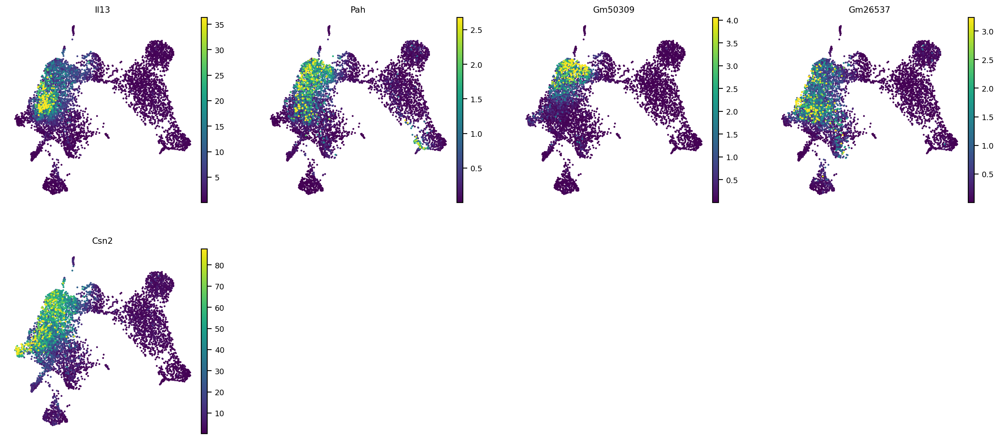

In [9]:
rna.pl.gene_embedding(
    adata[adata.obs.genotype == "WT"],
    deGenes["Aire+ mTECs"].head().index, # The top 5 DE genes for the Aire+ cluster
    layer="scVI_normalized", # can be a layer (i.e. 'raw_counts') or 'X'
    figsize = (4, 4), # size of each panel
    dpi = 80, # resolution of figure to show
    dpi_save = 300, # resolution of figure to save
    min_quantile = 0.01, # the quantile of expression for a gene to set the minimum of the colorbar to
    max_quantile = 0.99, # the quantile of expression for a gene to set the maximum of the colorbar to
    use_rep = "X_umap", # the embedding coordinates in 'adata.obsm' to use
    cmap="viridis",
)

### Condition vs control DE

You can also use scvi DE analysis to identify DE genes between samples (i.e. WT and KO) or across values in any other cell metadata ('obs') column.

In [43]:
de_df = model.differential_expression(
    groupby="genotype", group1="WT", group2="Fezf2_KO"
)

DE...: 100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


In [46]:
deFiltered = de_df[de_df.bayes_factor > 2]
deFiltered = deFiltered[(deFiltered.lfc_mean > 1) | (deFiltered.lfc_mean < -1)]
deFiltered = deFiltered[(deFiltered.non_zeros_proportion1 > 0.05) | (deFiltered.non_zeros_proportion2 > 0.05)]
deFiltered = deFiltered.sort_values(by="lfc_mean", ascending=False)

In [47]:
deFiltered

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Hoxc11,0.9614,0.0386,3.215138,0.000064,0.000015,0.0,0.25,2.666315,2.751240,3.340046,...,0.155974,0.013892,0.057139,0.007463,0.456931,0.037150,True,WT vs Fezf2_KO,WT,Fezf2_KO
Fabp9,0.9566,0.0434,3.092926,0.000555,0.000070,0.0,0.25,2.656820,2.511011,3.600928,...,2.871694,0.146269,0.136740,0.023421,6.454119,0.290293,True,WT vs Fezf2_KO,WT,Fezf2_KO
Mgam,0.9584,0.0416,3.137165,0.000078,0.000018,0.0,0.25,2.614584,2.700655,4.078595,...,0.162993,0.029851,0.064580,0.016188,0.448388,0.072412,True,WT vs Fezf2_KO,WT,Fezf2_KO
Calb1,0.9540,0.0460,3.032022,0.000091,0.000019,0.0,0.25,2.548517,2.581680,3.630567,...,0.243577,0.024110,0.065703,0.011481,0.609779,0.063879,True,WT vs Fezf2_KO,WT,Fezf2_KO
1810006J02Rik,0.9556,0.0444,3.069100,0.000258,0.000041,0.0,0.25,2.490694,2.553471,3.669172,...,0.722026,0.074168,0.136179,0.029277,1.879597,0.168662,True,WT vs Fezf2_KO,WT,Fezf2_KO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ctsl,0.9480,0.0520,2.903111,0.005363,0.009753,0.0,0.25,-1.742676,-1.903696,2.910536,...,11.470441,18.253574,0.644953,0.879219,63.754551,108.187859,True,WT vs Fezf2_KO,WT,Fezf2_KO
Lifr,0.9494,0.0506,2.931878,0.002257,0.004312,0.0,0.25,-1.844352,-1.991126,3.666098,...,2.740859,6.011363,0.422575,0.658439,23.268080,42.097260,True,WT vs Fezf2_KO,WT,Fezf2_KO
Anxa1,0.9294,0.0706,2.577509,0.002994,0.010023,0.0,0.25,-1.848079,-1.804376,2.565391,...,6.712301,39.252750,0.586270,0.863835,30.796413,117.173706,True,WT vs Fezf2_KO,WT,Fezf2_KO
Msln,0.9402,0.0598,2.755087,0.000741,0.002659,0.0,0.25,-1.871006,-1.955607,1.797255,...,2.056863,9.185258,0.392812,0.693226,7.007917,28.412712,True,WT vs Fezf2_KO,WT,Fezf2_KO


When generating feature plots of genes DE between WT and KO samples, I like to set the colorbar min/max based on the quantiles of gene expression in the WT data, and then use the same colorbar min/max for the KO data. This makes it more obvious when genes are expressed higher in one sample than another.

WT


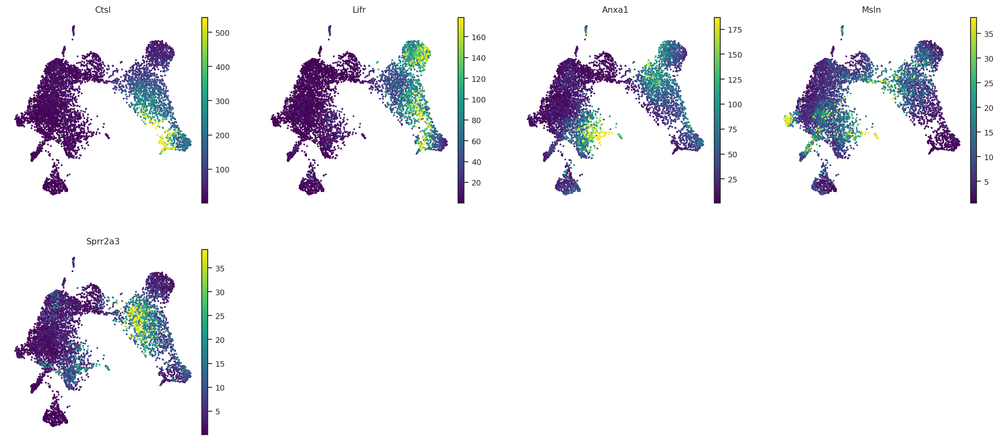

Fezf2_KO


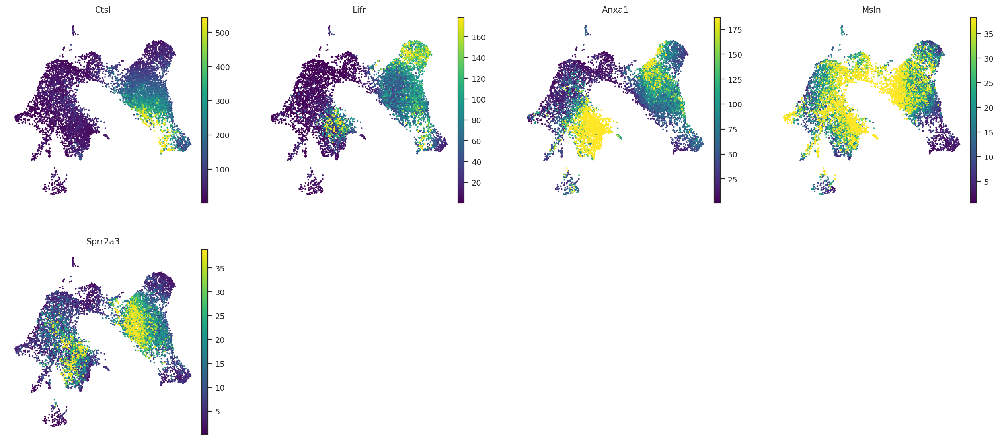

In [83]:
geneList = deFiltered.tail().index

vmin = []
vmax = []
for gene in geneList: # For each gene to plot
    expressionData = adata[adata.obs.genotype == "WT", gene].layers["scVI_normalized"] # Get the WT expression data
    vmin.append(np.quantile(expressionData, 0.01)) # get the 1st percentile of gene expression in the WT data
    vmax.append(np.quantile(expressionData, 0.99)) # get the 99th percentile of gene expression in the WT data
    
print("WT")
# Plot the gene exprssion in the WT data
sc.pl.umap(
    adata[adata.obs.genotype == "WT"],
    color=geneList,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    cmap="viridis",
)

print("Fezf2_KO")
# Plot the gene exprssion in the KO data
sc.pl.umap(
    adata[adata.obs.genotype == "Fezf2_KO"],
    color=geneList,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    cmap="viridis",
)

WT


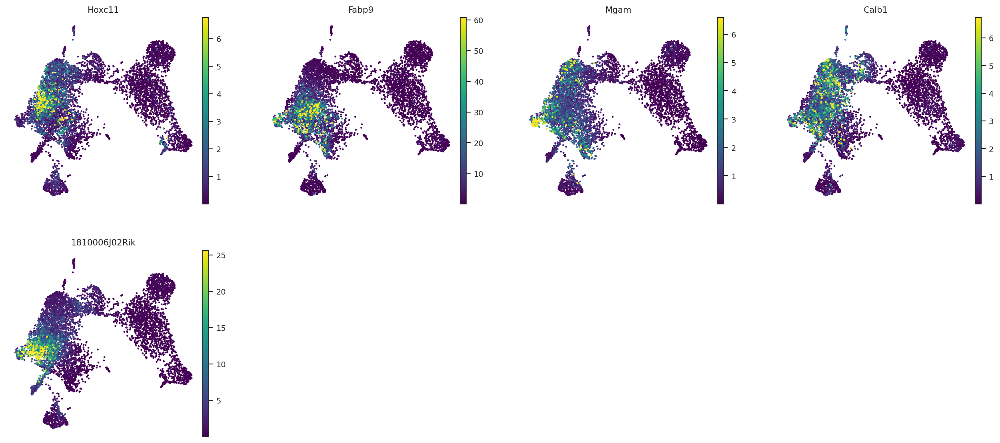

Fezf2_KO


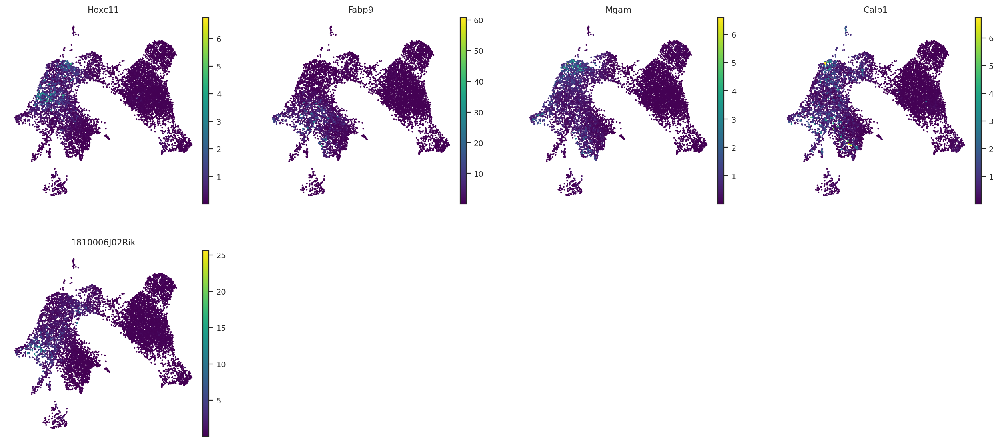

In [84]:
geneList = deFiltered.head().index

vmin = []
vmax = []
for gene in geneList:
    expressionData = adata[adata.obs.genotype == "WT", gene].layers["scVI_normalized"]
    vmin.append(np.quantile(expressionData, 0.01))
    vmax.append(np.quantile(expressionData, 0.99))
    
print("WT")
sc.pl.umap(
    adata[adata.obs.genotype == "WT"],
    color=geneList,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    cmap="viridis",
)

print("Fezf2_KO")
sc.pl.umap(
    adata[adata.obs.genotype == "Fezf2_KO"],
    color=geneList,
    layer="scVI_normalized",
    vmin=vmin,
    vmax=vmax,
    cmap="viridis",
)

## Cell type identification with cosine similarity

Cosine similarity scoring allows each cell's expression to be compared with the expression signature of annotated cell types (for example from immgen) to assign a per cell score. This method can aid unbiased cell type identification by looking for annotated signatures with high scores in unknown cell types, and customm signatures can be created from published datasets (see scrnatools documentation)

In [56]:
immgen = rna.tl.get_immgen_similarity_signatures(save_path="data") 
immgen

,SC_LT34F_BM,SC_LTSL_BM,SC_STSL_BM,SC_LTSL_FL,SC_STSL_FL,SC_MPP34F_BM,SC_ST34F_BM,SC_CMP_BM,SC_MEP_BM,SC_GMP_BM,...,Ep_MEChi_Th,Fi_MTS15+_Th,Fi_Sk,FRC_MLN,FRC_SLN,LEC_MLN,LEC_SLN,BEC_MLN,BEC_SLN,St_31-38-44-_SLN
gene_name,,,,,,,,,,,,,,,,,,,,,
0610009B22Rik,6.797117,6.360333,6.662006,6.427335,6.437454,6.679156,6.790981,6.943933,7.635508,7.117373,...,6.476976,6.609829,6.502716,6.731251,6.780717,6.816932,7.149442,6.942866,6.996807,6.529115
0610009L18Rik,7.316544,8.168883,7.861428,7.800822,7.507517,7.541081,7.455853,7.620293,7.114336,7.677924,...,7.996490,7.452834,7.537444,7.763949,7.545011,7.574276,7.177180,7.643272,7.463900,7.600032
0610010F05Rik,7.400632,7.056768,7.160870,7.381136,7.572367,7.270314,7.473560,7.626782,7.475628,6.164643,...,7.275631,6.908525,6.612712,5.439932,6.098217,6.716511,7.119968,6.492121,6.728206,6.356234
0610010K14Rik,9.246308,9.295594,8.917933,9.367240,9.247446,9.598990,9.599037,9.286498,9.292842,10.031798,...,8.417190,8.377814,9.693119,8.777117,8.631075,9.212467,9.399297,9.395945,9.408379,8.609123
0610038B21Rik,5.861660,6.171731,5.818086,6.296947,6.031117,6.096877,5.932255,6.636587,6.368213,6.342167,...,6.041710,5.763672,6.043463,6.192078,5.952597,5.838795,5.687346,6.040654,5.863289,6.197374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zyx,9.272275,10.091382,10.290411,9.686166,9.693199,9.263065,9.275447,9.290837,7.203798,9.167604,...,7.627300,8.744558,9.711825,9.024311,8.776755,9.386212,9.366995,9.160313,9.040734,9.292802
Zzef1,8.120165,8.430231,8.487346,8.168742,8.455237,7.849267,8.083128,8.474797,8.285157,7.571358,...,7.780487,8.307825,7.919775,7.882258,8.075704,8.389248,8.321919,8.261564,8.307784,7.852217
Zzz3,9.536164,9.641560,9.469255,9.798141,9.703494,9.309358,9.564820,9.540835,9.438682,7.894254,...,8.883996,9.326355,8.868233,8.466615,8.921892,8.794250,9.027696,8.824545,8.883593,8.514935


In [57]:
adata=rna.tl.cell_type_similarity(
    adata,
    signatures=immgen, # The gene x cell type DataFrame containing cell type signatures for scoring
)

In [58]:
# List all similarity scores
[i for i in adata.obs.columns if "cosine_similarity" in i]

['SC_LT34F_BM_cosine_similarity_cell_z_score',
 'SC_LTSL_BM_cosine_similarity_cell_z_score',
 'SC_STSL_BM_cosine_similarity_cell_z_score',
 'SC_LTSL_FL_cosine_similarity_cell_z_score',
 'SC_STSL_FL_cosine_similarity_cell_z_score',
 'SC_MPP34F_BM_cosine_similarity_cell_z_score',
 'SC_ST34F_BM_cosine_similarity_cell_z_score',
 'SC_CMP_BM_cosine_similarity_cell_z_score',
 'SC_MEP_BM_cosine_similarity_cell_z_score',
 'SC_GMP_BM_cosine_similarity_cell_z_score',
 'SC_CDP_BM_cosine_similarity_cell_z_score',
 'SC_MDP_BM_cosine_similarity_cell_z_score',
 'MLP_BM_cosine_similarity_cell_z_score',
 'MLP_FL_cosine_similarity_cell_z_score',
 'proB_CLP_BM_cosine_similarity_cell_z_score',
 'proB_FrA_BM_cosine_similarity_cell_z_score',
 'proB_FrBC_BM_cosine_similarity_cell_z_score',
 'preB_FrC_BM_cosine_similarity_cell_z_score',
 'preB_FrD_BM_cosine_similarity_cell_z_score',
 'B_FrE_BM_cosine_similarity_cell_z_score',
 'proB_CLP_FL_cosine_similarity_cell_z_score',
 'proB_FrA_FL_cosine_similarity_cell_z

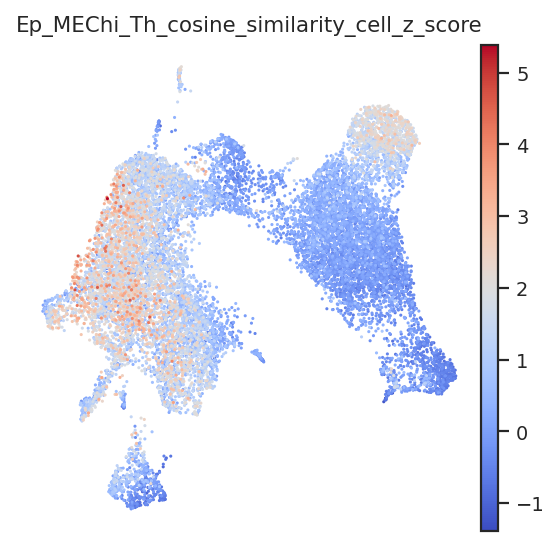

In [72]:
# Plot a similarity score on a UMAP
sc.pl.umap(
    adata,
    color=["Ep_MEChi_Th_cosine_similarity_cell_z_score"],
    cmap="coolwarm",
)

## Differential density plotting

Differential density ploting highlights regions of a UMAP/TSNE that are enriched for cells from one sample vs another sample (ie. WT vs KO), allowing for differences in the cell type composition of samples to be visualized. However, beecause this analysis is based on interpreting cell to cell differences in UMAP space, any preliminary results using this method *MUST* be validated using an orthogonal experimental approach, i.e. flow cytometry.

In [70]:
adata = rna.tl.log_density_ratio(
    adata,
    group_by="genotype", # The column in adata.obs containing condition/control labels
    groups=["WT", "Fezf2_KO"], # The condition/control labels in adata.obs[group_by] to use
    latent_rep="X_umap", # The latent representation to calculate density over
    key_added="KO/WT_log_density_ratio", # The column to add to adta.obs with the differential density ratio
)

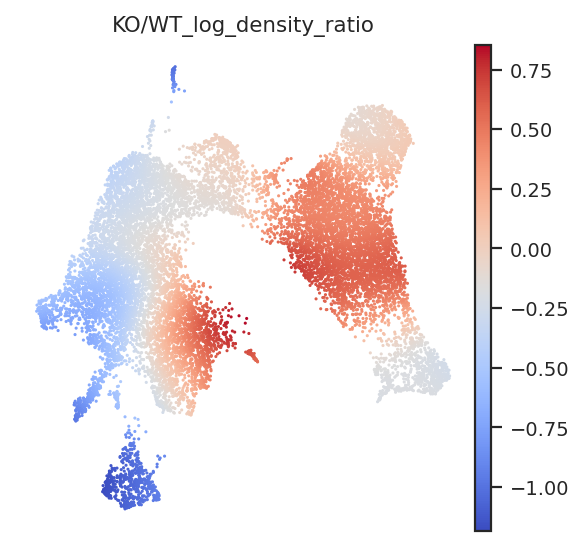

In [73]:
sc.pl.umap(
    adata,
    color="KO/WT_log_density_ratio",
    cmap="coolwarm",
)

## Other helpful tools

### Extract expression data

In [62]:
# Returns a cell x gene DataFrame with expression data from 'adata.X' 'adata.raw' or a layer in 'adata.layers'
data = rna.tl.get_expression_matrix(
    adata,
    "scVI_normalized", # Can be 'X', 'raw', or a layer in 'adata.layers'
)
data

,Xkr4,Gm37381,Rp1,Sox17,Rgs20,Oprk1,Alkal1,St18,Gm30414,Sntg1,...,Egfl6,Tmsb4x,Frmpd4,Arhgap6,Amelx,Gm28588,Gm28510,Gm28074,AC133103.5,AC168977.1
AAACCCACAAGACCGA-1-WT,18.823454,0.004134,0.005862,1.608717e-05,2.505183,0.000546,0.002831,0.777801,0.055469,17.307499,...,0.100271,176.472275,2.878987,0.727143,0.104938,7.256937e-06,1.586581e-03,1.045957e-06,0.000006,0.046822
AAACCCACAAGATTGA-1-WT,4.895051,0.020770,0.035133,2.727747e-06,1.169733,0.000006,0.000058,82.182007,0.003841,3.551615,...,0.000711,143.782486,38.802811,0.528096,0.037615,1.612596e-05,1.773033e-07,7.084931e-07,0.000020,0.015348
AAACCCACACGACGAA-1-WT,1.077126,0.000433,0.011951,8.892387e-05,1.530120,0.000236,0.026082,0.380087,0.000318,3.319164,...,0.002749,360.246185,0.338713,3.779425,0.005965,6.055845e-07,3.184118e-06,1.979689e-04,0.000034,0.141637
AAACCCACACTGAATC-1-WT,10.196169,0.073868,0.463036,2.103196e-02,7.132372,0.004906,0.008555,9.269258,0.143199,7.477673,...,0.068916,61.731697,6.165103,0.886325,1.193832,4.492858e-03,4.314055e-02,6.638059e-04,0.004879,0.353682
AAACCCAGTTCGGCTG-1-WT,7.993515,0.146901,0.581940,6.817779e-02,8.323462,0.080027,0.060026,6.780364,0.357827,4.623000,...,0.219845,76.033279,5.957157,2.907507,0.536656,3.579874e-02,4.854485e-01,4.526417e-02,0.072467,0.854312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCAACCTA-1-Fezf2_KO,2.548387,0.000480,0.002046,4.350716e-04,1.225986,0.003811,0.019292,0.954858,0.039657,2.119519,...,0.005951,534.210571,5.092393,4.407473,0.202098,1.791732e-03,1.624419e-04,7.801430e-07,0.000002,0.116554
TTTGTTGGTCCAGGTC-1-Fezf2_KO,4.227162,0.016469,0.022816,2.088599e-04,2.489198,0.000375,0.035537,0.959702,0.235521,2.927808,...,0.053903,464.509827,4.505892,1.393913,1.660008,3.106999e-03,1.082532e-02,1.833763e-04,0.001143,0.183799
TTTGTTGGTGAATTAG-1-Fezf2_KO,1.267614,0.002368,0.041214,3.563939e-03,0.941203,0.004349,0.315795,0.728161,0.120445,1.961209,...,0.468476,331.754913,2.371984,0.905934,0.561191,3.437305e-03,4.827051e-03,2.242354e-04,0.000434,1.105946
TTTGTTGTCACGGGCT-1-Fezf2_KO,3.647966,0.000144,0.002161,9.166230e-07,2.787066,0.002580,0.027500,0.208728,0.000106,4.838236,...,0.004641,338.723022,2.347623,4.021752,0.011646,1.944578e-06,1.008539e-06,1.678100e-06,0.000015,0.007015


### Gene set enrichment scores

Scanpy has a method that allows you to provide a list of genes that it then uses to score cells based on their enrichment of expression of genes from that list versus all other genes.

In [63]:
TRAs = pd.read_csv("data/TRA_list.csv", index_col=0)
TRAs

,0
0,Xkr4
1,Rp1
2,Sox17
3,Oprk1
4,Npbwr1
...,...
4934,Ube1y1
4935,ERCC-00041
4936,ERCC-00085
4937,ERCC-00117


In [64]:
TRAs = TRAs["0"].tolist()
TRAs

['Xkr4',
 'Rp1',
 'Sox17',
 'Oprk1',
 'Npbwr1',
 'St18',
 'Sntg1',
 '3110035E14Rik',
 'Ppp1r42',
 'Cpa6',
 'Sulf1',
 'Prdm14',
 'Xkr9',
 'Gm5523',
 'Msc',
 'Trpa1',
 'Kcnb2',
 'Gdap1',
 'Pi15',
 'Tfap2b',
 'Pkhd1',
 'Il17a',
 '6720483E21Rik',
 'Gsta3',
 'Khdc1a',
 'Rims1',
 'Mir30c-2',
 'Col9a1',
 'Bai3',
 'Gm20172',
 'Khdrbs2',
 'Gm5415',
 'Gm15455',
 'Bend6',
 'Cfc1',
 'Fam123c',
 'Zap70',
 'Lyg1',
 'Lonrf2',
 'Creg2',
 'Rfx8',
 'Il1r2',
 'Il18rap',
 'Slc9a2',
 'Tmem182',
 '2610017I09Rik',
 'Pou3f3',
 '2900092D14Rik',
 'Gpr45',
 '1500015O10Rik',
 '4832428D23Rik',
 'Col3a1',
 'Tmeff2',
 'Boll',
 '9130227L01Rik',
 'Satb2',
 'Aox3',
 'Aox4',
 'Als2cr12',
 'Gm973',
 'Cd28',
 'Ctla4',
 'Zdbf2',
 'Mdh1b',
 'Gm13749',
 'Akr1cl',
 'D630023F18Rik',
 'Unc80',
 'Myl1',
 'Cps1',
 'Erbb4',
 'Spag16',
 'Vwc2l',
 'Abca12',
 'Gm8883',
 '4933417E11Rik',
 'Tmem169',
 'March4',
 'Igfbp2',
 'Pinc',
 '6030407O03Rik',
 'Rufy4',
 'Cxcr2',
 'Cxcr1',
 'Slc11a1',
 'Vil1',
 'Wnt10a',
 'Cdk5r2',
 'Fev',
 'Cryba

In [65]:
TRAs = [i for i in TRAs if i in adata.var_names]

In [66]:
sc.tl.score_genes(
    adata,
    gene_list=TRAs, # The list of genes to score each cell's enrichment of expression of
    use_raw=True, # Always use log-transformed expression for this analysis
    score_name="TRA_score", # The column name of the score to be added to 'obs'
)

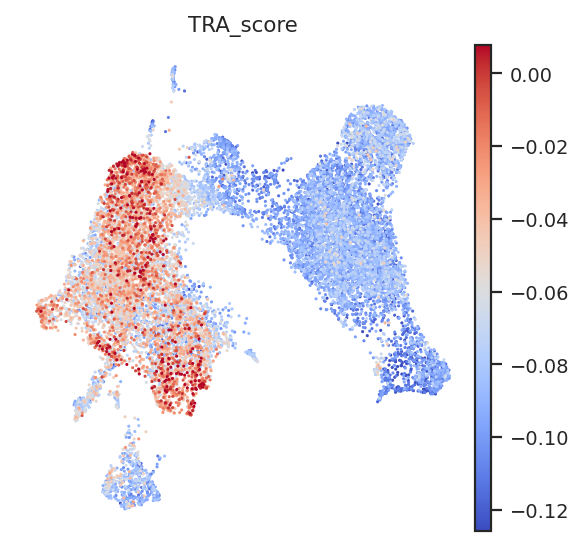

In [67]:
sc.pl.umap(
    adata,
    color="TRA_score",
    cmap="coolwarm",
    vmin=np.quantile(adata.obs.TRA_score, 0.01),
    vmax=np.quantile(adata.obs.TRA_score, 0.99),
)

### Cell cycle analysis

Scanpy also has a special gene list eenrichment scoring method that can be used to annotate th cell cycle phase of cells in a dataset based on published cell cycle genes.

In [68]:
# A published list of human S and G2M genes
cell_cycle_genes = list(pd.read_csv("data/regev_lab_cell_cycle_genes.txt", header=None)[0]) 
# Convert to mouse gene names the easy way (lowercase for all letters but the first)
cell_cycle_genes = [i.capitalize() for i in cell_cycle_genes]
# Split into the S and G2M genes
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

In [ ]:
sc.tl.score_genes_cell_cycle(adata, s_genes, g2m_genes)

/home/joe/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


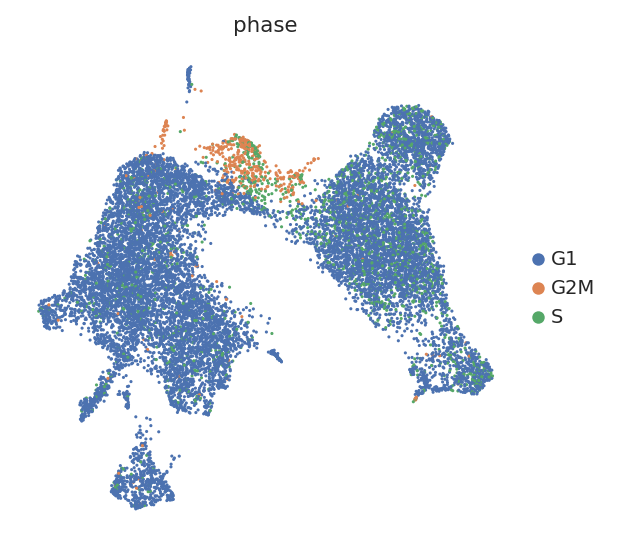

In [69]:
sc.pl.umap(
    adata,
    color="phase",
)

## Save data

In [74]:
adata.write("data/scRNAseq_tutorial_thymus_data.h5ad")